<a href="https://colab.research.google.com/github/Shriharsh7/Dog_Vision/blob/main/Dog_Vision_Kaggle.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 🐶🐶 End-To-End Multi-Class Dog Breed Classification

This notebook builds and end to end multic-class image classifier using TensorFlow 2.0 and TensorFlow Hub

# 1. Problem
  Identifying the breed of a dog, given an image of the dog
  When I'm strolling and I click a picture of a dog and I want to know  its breed

# 2. Data
  The Data we are using is from a kaggle dog-breed identification competition

# 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image

# 4. Features

Some features abut the data

1. We are dealing with images(Unstructured data) so it's best to use Deep learning/Transfer learning
2. Data set has 120 breeds of dogs (120 Different classes)
3. There are more than 10,000 images for both training and testing sets.


Wed Jun 21 05:22:30 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Unzipping the uploaded data into Google Drive
!unzip "drive/MyDrive/Dog-Vision/dog-breed-identification.zip" -d  "drive/MyDrive/Dog-Vision/"

Archive:  drive/MyDrive/Dog-Vision/dog-breed-identification.zip
replace drive/MyDrive/Dog-Vision/labels.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

## Getting our workspace ready

In [ ]:
# Import tensorflow into colab

import tensorflow  as tf
import tensorflow_hub as hub
print("TensorFlow version:" , tf.__version__)
print("Tf_hub version:", hub.__version__)

# Check for gpu availibility
print("GPU", "AVAILABLE(Yess!!)" if tf.config.list_physical_devices("GPU") else "Not Available" )

## Getting our data ready into tensors

~ With all the ML models, our data has to be in numerical format

Tensors - Numerical representation

In [ ]:
# Accesing our data (labels)
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog-Vision/labels.csv")
print(labels_csv.describe() )
print(labels_csv.head())

<Axes: >

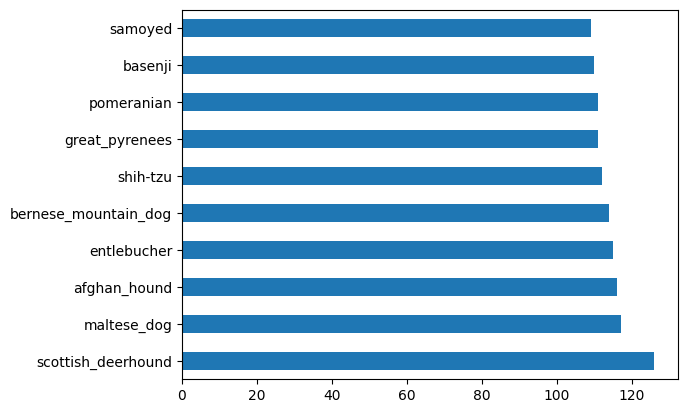

In [ ]:
# How many images are there of each individual breed?
import matplotlib.pyplot as plt
labels_csv["breed"].value_counts().head(10).plot.barh()

In [ ]:
labels_csv.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog-Vision/train/00b7d114bc5166a629a3cc03d9329120.jpg")

### Getting images and their labels
let's get a list of all our image file pathnames

In [ ]:
filenames = ["drive/MyDrive/Dog-Vision/train/"+fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog-Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
if len(filenames) == len(os.listdir("drive/MyDrive/Dog-Vision/train/")):
  print("Conversion Successfull!!!")
else:
  print("Wrong, have you done. Improve, you must!")

Conversion Successfull!!!


## Converting Labels into numbers

In [ ]:
import numpy as np
labels = np.array(labels_csv["breed"])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if length of labels matches the length of filenames
len(labels) == len(filenames)

True

In [ ]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into a boolean array
labels[0] == unique_breeds


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Now turning all the labels into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Turning boolean array into integers
print(labels[0], ": Original label")
print(np.where(labels[0] == unique_breeds), ": Index where label occurs")
print(boolean_labels[0].argmax(), ": Index where label occurs in the boolean array")
print(boolean_labels[0].astype(int), ": There will be a 1 where sample label occurs")


boston_bull : Original label
(array([19]),) : Index where label occurs
19 : Index where label occurs in the boolean array
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0] : There will be a 1 where sample label occurs


## Creating our own validation set


In [ ]:
# Setting up X and y variables
X = filenames
y = boolean_labels

We're going to start experimenting with 1000 images and increase it as and when needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param{type:"slider",min:1000,max:10000,step:1000}


In [ ]:
from sklearn.model_selection import train_test_split as tts
#split them into training and validation of total size NUM_IMAGES

X_train,X_val,y_train,y_val = tts(X[:NUM_IMAGES],
                                  y[:NUM_IMAGES],
                                  test_size = 0.2,
                                  random_state = 69)

len(X_train), len(X_val), len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:2],y_train[1]

(['drive/MyDrive/Dog-Vision/train/0d68c98ac13f84032cb863abf0498a02.jpg',
  'drive/MyDrive/Dog-Vision/train/0825e8471e3c9a14dc341bdd8630f05e.jpg'],
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
 

## Preprocessing images (turning images into Tesnors)
To preprocess the images into corresponding tensors we are creating a function which does a few things



1.   Takes an image filepath as an input
2.   Use TensorFlow to read our image file and save it to variable, 'image'
3.   Turn our 'image'(jpg) into a tensor
4.   Resize the 'image' to be a shape of (224,224)
5.   Return the modified 'image'




In [ ]:
from matplotlib.pyplot import imread
img = imread(filenames[69])
img.shape

(375, 500, 3)

In [ ]:
# Turn image into a tensor
tf.constant(img)

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[  4,   3,   0],
        [  7,   6,   2],
        [  9,   8,   4],
        ...,
        [  6,   6,   6],
        [  6,   6,   6],
        [  6,   6,   6]],

       [[  4,   3,   0],
        [  3,   2,   0],
        [  1,   0,   0],
        ...,
        [  5,   5,   5],
        [  5,   5,   5],
        [  5,   5,   5]],

       [[  7,   6,   2],
        [  3,   2,   0],
        [  1,   0,   0],
        ...,
        [  4,   4,   4],
        [  4,   4,   4],
        [  4,   4,   4]],

       ...,

       [[118, 118, 116],
        [117, 117, 115],
        [116, 116, 114],
        ...,
        [ 16,  15,  11],
        [ 14,  13,   9],
        [ 12,  11,   7]],

       [[111, 111, 109],
        [111, 111, 109],
        [112, 112, 110],
        ...,
        [ 15,  14,  10],
        [ 14,  13,   9],
        [ 13,  12,   8]],

       [[107, 107, 105],
        [108, 108, 106],
        [110, 110, 108],
        ...,
        [ 14,  13,   

Now we've seen what an image looks like as a tensor so we'll create the function

1. Takes an image filepath as an input
2. Use TensorFlow to read our image file and save it to variable, 'image'
3. Turn our 'image'(jpg) into a tensor
4. Resize the 'image' to be a shape of (224,224)
5. Return the modified 'image'

In [ ]:
# Define image size
IMG_SIZE = 224

# create preprocessing function

def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and converts it into a tensor
  """
  # Reading an image
  image = tf.io.read_file(image_path)
  # Turn jpg image into numerical tensor with 3 colour channels RGB
  image = tf.io.decode_jpeg(image, channels = 3)
  # Convert the colour channel values of 0-255 into 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Image resisizing
  image = tf.image.resize(image, size = [IMG_SIZE,IMG_SIZE])

  return image

## Turning our data into batches
Why turn data into batches?

lets say if you try to process 10k plus images in one go, they all might not fit into memory
hence 32 at a time

In order to use TensorFlow effectively, we need our data in the form of tensor tuples eg (image, label)

In [ ]:
# Creating a function to return a tuple(image, label)

def get_image_label(image_path, label):

  """
  Takes in an image filepath and the associated label and returns the tuple (image, label)
  """

  image = process_image(image_path, label)

  return image, label

In [ ]:
#demo of above
process_image(X[42],y[42])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117759],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

## Converting data into batches using a function

In [ ]:
# Defining batch size as 32
BATCH_SIZE = 32

def create_data_batch(X,y=None,batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data from image (X) and labels (y) pairs
  Shuffles the data if it's training data and doesn't shuffle Validation data
  """
  # If the data is a test dataset, we probably do not have labels
  if test_data:
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #Only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a validation dataset, we do not need to shuffle it
  elif valid_data:
    print("Creating validation data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),# filepaths
                                               tf.constant(y) #labels
                                               ))

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),# filepaths
                                               tf.constant(y) #labels
                                               ))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling later
    # Because right now it is just a string/numbers later it will be an image then complex stuff

    data = data.shuffle(buffer_size = len(X))

    # Create (image,label) tuples as this also turns image path into preprocessed image
    data = data.map(get_image_label)
    #Batching it

    data_batch = data.batch(BATCH_SIZE)

    return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batch(X_train,y_train)
val_data = create_data_batch(X_val,y_val, valid_data=True)


Creating training data batches
Creating validation data batches


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing our data batches

In [ ]:
import matplotlib.pyplot as plt

# Create a function to view images in a data batch

def show_25_images (images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  #Setup the figure
  plt.figure(figsize = (15,15))
  for i in range(25):
    # Create subplots of 5 rows and 5 columns
    ax = plt.subplot(5,5,i+1)
    #Display image
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.7212798 , 0.5879465 , 0.44284844],
          [0.6548467 , 0.5215134 , 0.37641534],
          [0.7843619 , 0.6510285 , 0.50561535],
          ...,
          [0.6104706 , 0.47713724, 0.3281176 ],
          [0.69948775, 0.55771595, 0.4340116 ],
          [0.8247633 , 0.6796652 , 0.5659397 ]],
 
         [[0.63539976, 0.497287  , 0.35457864],
          [0.7575647 , 0.61945194, 0.47674364],
          [0.6918494 , 0.55392873, 0.41071326],
          ...,
          [0.86294633, 0.7272233 , 0.5782036 ],
          [0.790386  , 0.648977  , 0.5201304 ],
          [0.7222533 , 0.57954496, 0.45865035]],
 
         [[0.6999819 , 0.55567175, 0.4145188 ],
          [0.64728147, 0.504792  , 0.36362484],
          [0.81486076, 0.67293143, 0.5314447 ],
          ...,
          [0.730679  , 0.58247715, 0.43712536],
          [0.78395903, 0.6427825 , 0.50932664],
          [0.6918289 , 0.55065244, 0.42202845]],
 
         ...,
 
         [[0.65401953, 0.50107837, 0.3823984 ],
          [0.60452

In [ ]:
unique_breeds[y[19].argmax()]

'boxer'

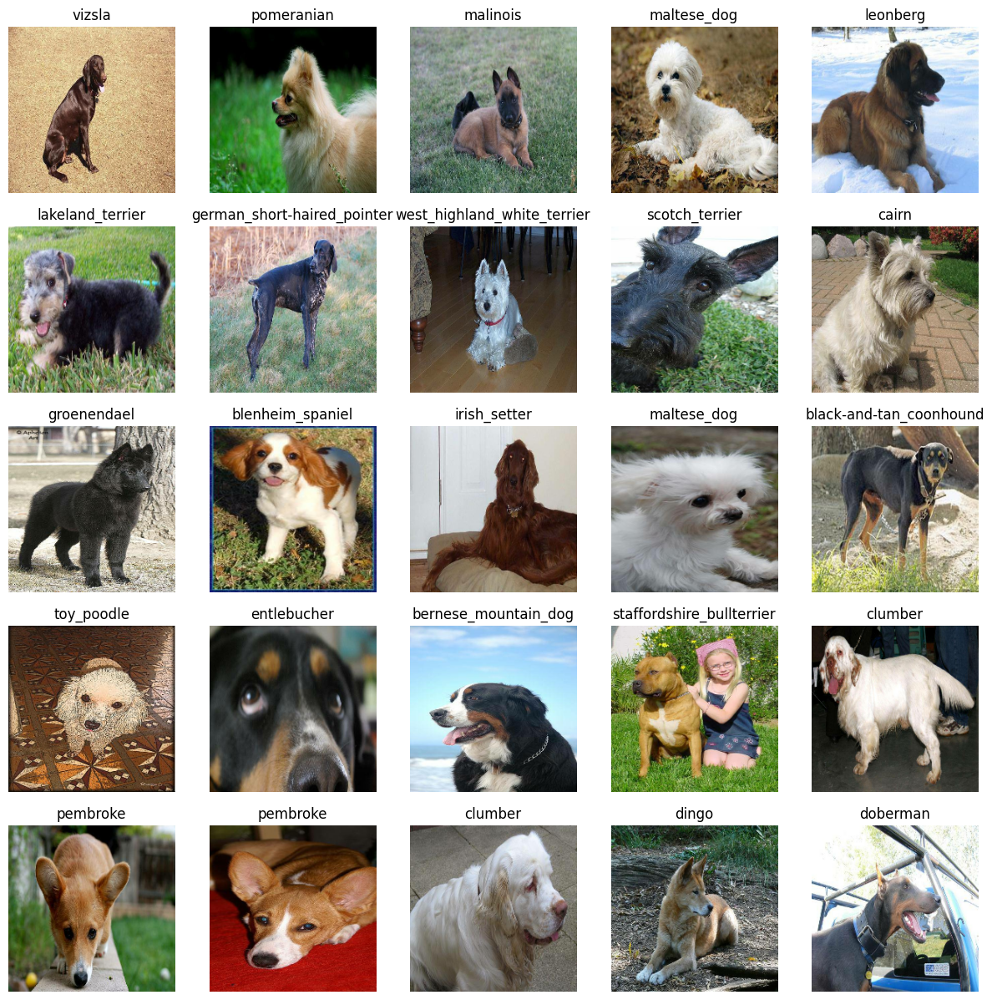

In [ ]:
# Visualizing the data in a training batch
show_25_images(train_images, train_labels)

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
len(val_images), len(val_labels)

(32, 32)

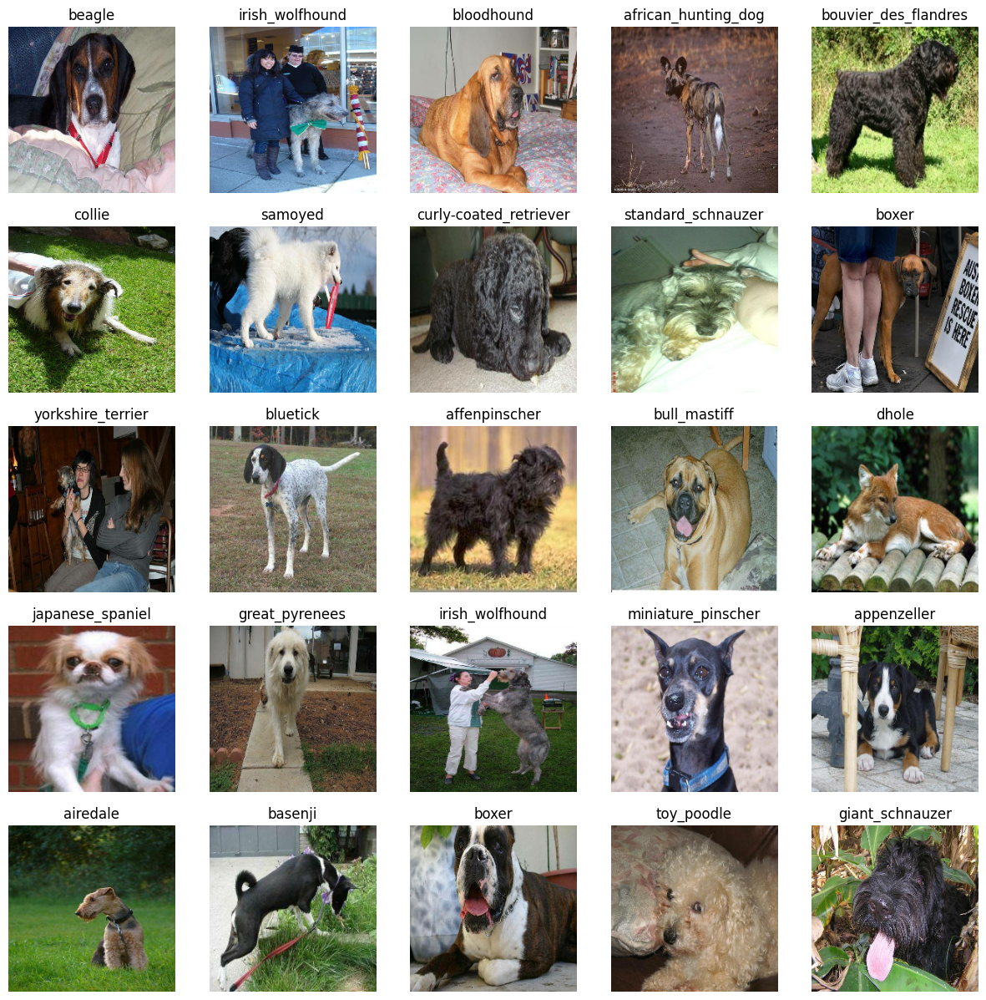

In [ ]:
show_25_images(val_images, val_labels)

## Building a model


1.   The input shape (images in the form of tensors) to our model
2.   The output shape (labels in form of tensors) of our model
3.   The URL of the model we want to use:
"https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"



In [ ]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, ht, wifth, color channel
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we have our input, output and model ready, now using it in the keras deep learning model!

Knowing this let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters
* Defines layers in the keras in a sequential manner
* Compiles the model (Says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model

In [ ]:
# Create a function which builds a keras model

def create_model(input_shape= INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  """

  """
  print("Builiding model with:",MODEL_URL)
  # Setup the model layers

  model = tf.keras.Sequential([
                                hub.KerasLayer(MODEL_URL), #layer 1 (INPUT LAYER)
                                tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                      activation = "softmax" ) # Layer 2 OUTPUT LAYER
  ])

  # Compile the model

  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model

  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Builiding model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions that a model can use during training to do such things as save its progress, check
its progress or stop training early if a model stops to improve.

We'll create 2 Callback functions , one for TensorBoard which helps to track progress and another for early stopping which prevents our model from training to long

### TensorBoard Callback



1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's 'fit()' function ✅
3. Visualize our models training logs with the %tensorboard magic functiion (To do after training)



In [ ]:
# Load TensorBoard Extension
%load_ext tensorboard

In [ ]:
import datetime

# Creating a function to build a tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog-Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callbacks

It helps to stop our model from overfitting by stopping training if a certain evaluation metric stops to improve.


In [ ]:
# Create an earlystopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

## Training a model (On a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param{type:"slider",min:10,max:100,step:10}

## Let's create a function which trains our model

* Create a model using `create_model()`
* Setup a tensorboard callback using `create_tensorboard_callback`
* Call the `fit()` function on our model passing it training and validation data, number of epochs `NUM_EPOCHS` AND CALLBACKS we'd list_physical_devices
* Return the model


In [ ]:
def train_model():
  # Crete a model
  model = create_model()

  # Create a new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1 ,
            callbacks = [tensorboard, early_stopping])

  #Returning the trained model

  return model

In [ ]:
# fit the model to the data

model = train_model()

Builiding model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 168s 6s/step - loss: 4.6045 - accuracy: 0.0737 - val_loss: 3.5834 - val_accuracy: 0.2150
Epoch 2/100
25/25 [==============================] - 67s 3s/step - loss: 1.5982 - accuracy: 0.7163 - val_loss: 2.2443 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 80s 3s/step - loss: 0.5465 - accuracy: 0.9413 - val_loss: 1.7556 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 72s 3s/step - loss: 0.2348 - accuracy: 0.9925 - val_loss: 1.5693 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 73s 3s/step - loss: 0.1372 - accuracy: 1.0000 - val_loss: 1.4887 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 70s 3s/step - loss: 0.0946 - accuracy: 1.0000 - val_loss: 1.4462 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==============================] - 73s 3s

## Checking the TensorBoard logs

the tensorboard magic function `%tensorboard` will access the logs we created during the time we trained our model and visualize it

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog-Vision/logs

<IPython.core.display.Javascript object>

## Making and Evaluating predictions using a trained model


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(val_data, verbose = 1)
predictions.shape

7/7 [==============================] - 14s 2s/step


(200, 120)

In [ ]:
np.sum(predictions[1])

0.9999999

In [ ]:
# Making predictions and formatting it in terms we can understand

index = 42
#print(predictions[index])
print(f"Max value (Probability of Prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predictions[index])]}")

Max value (Probability of Prediction): 0.9294788241386414
Sum: 1.0
Max Index: 13
Predicted label:blenheim_spaniel


## Doing what we did above at scale and simultaneously loading up the actual image with predicted and actual label

Note: prediction probabities are also known as confidence levels

In [ ]:
# Turn prediction probabilities into their corresponding predicted label

def get_pred_label(prediction_probabilities):
  # Turns an array of prediction probabilities into a corresponding label with max value of probability

  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction_probabilities

pred_label = get_pred_label(predictions[103])
pred_label

'cairn'

Now since our validation data is in batch form we need to un-batch it in order to make prediction on the validation images and then
compare those predictions to the validation labels `(true labels)`

In [ ]:
# Create a function to unbatch the batched data

def unbatchify(data):
  """
  takes a batched dataset of images and labels together in a tensor and returns the separate array
  of images and labels
  """

  images = []
  labels = []
  # Loop through the unbatched data

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images,labels

# Unbatchifying the validation data
val_images, val_labels = unbatchify(val_data)
val_images[69] , val_labels[69]


(array([[[0.05288405, 0.03378852, 0.01893383],
         [0.06739181, 0.05170553, 0.03994082],
         [0.0761371 , 0.0719004 , 0.06500265],
         ...,
         [0.10196079, 0.06666667, 0.04705883],
         [0.08960081, 0.07118351, 0.05490196],
         [0.08627451, 0.07450981, 0.05490196]],
 
        [[0.04944345, 0.03782021, 0.02950806],
         [0.05081212, 0.04261009, 0.03334013],
         [0.05823448, 0.05419825, 0.04669908],
         ...,
         [0.10196079, 0.06666667, 0.04705883],
         [0.08960081, 0.07118351, 0.05490196],
         [0.08627451, 0.07450981, 0.05490196]],
 
        [[0.04540762, 0.04564397, 0.04611665],
         [0.03680762, 0.03371763, 0.02753766],
         [0.04199205, 0.0380135 , 0.03015137],
         ...,
         [0.10196079, 0.06666667, 0.04705883],
         [0.08960081, 0.07118351, 0.05490196],
         [0.08627451, 0.07450981, 0.05490196]],
 
        ...,
 
        [[0.6764975 , 0.520198  , 0.42101473],
         [0.8018059 , 0.630884  , 0.52737

We'll create a function which:

* Takes an array of prediction_probabilities, an array of true labels and an array of images and integers
* Convert prediction probaility into predicted label
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
  pred_prob,true_label,image = prediction_probabilities[n], labels[n], images[n]

  # Get prediction label
  pred_label = get_pred_label(pred_prob)

  #plot image and remove ticks

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the prediction depending on whether it is right or wrong

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"


  # Change plot title to be predicted, probability of predicted label in percent and true label
  plt.title("{} {:2.0f}% {} ".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color = color)

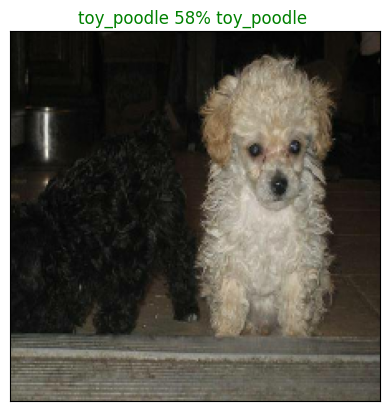

In [ ]:
plot_pred(predictions, val_labels, val_images, n=152)

## Top 10 predictions
This function will
* Take an input of prediction probabilities array and truth array and an integer
* Find prediction using `get_pred_label()`
* Find the top 10:
  1. prediction probabilities indices
  2. pp values
  3. prediction labels
*Plot top 10 prediction probability values and labels, coloring the true label green

In [ ]:
gtr = 6
pr = 2

def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Top 10 highest confidence levels along with true labels for sample n
  """
  pred_prob, true_labels = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find top 10 prediction confidence indices
  top_10_pred_indices = pred_prob.argsort()[-10:][::-1]

  # Top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indices]

  # Top 10 pred labels corresponding to the above 10 values
  top_10_pred_labels = unique_breeds[top_10_pred_indices]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  gtr = true_labels
  pr = top_10_pred_labels

  #Change color of true label
  if np.isin(true_labels, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_labels)].set_color("green")
  else:
    pass


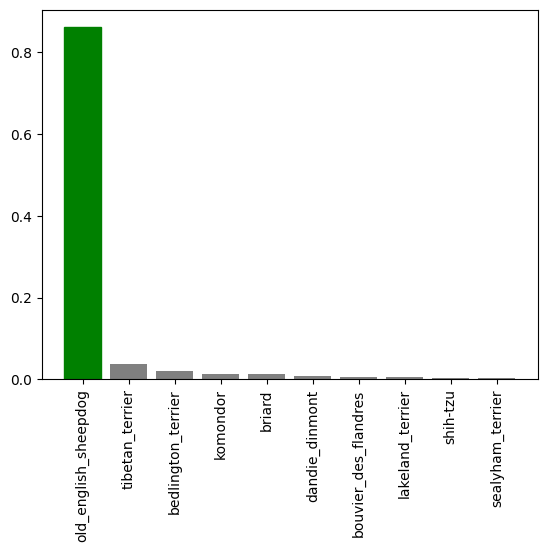

In [ ]:
plot_pred_conf(predictions,val_labels, 130)

## Combining above 2 functions

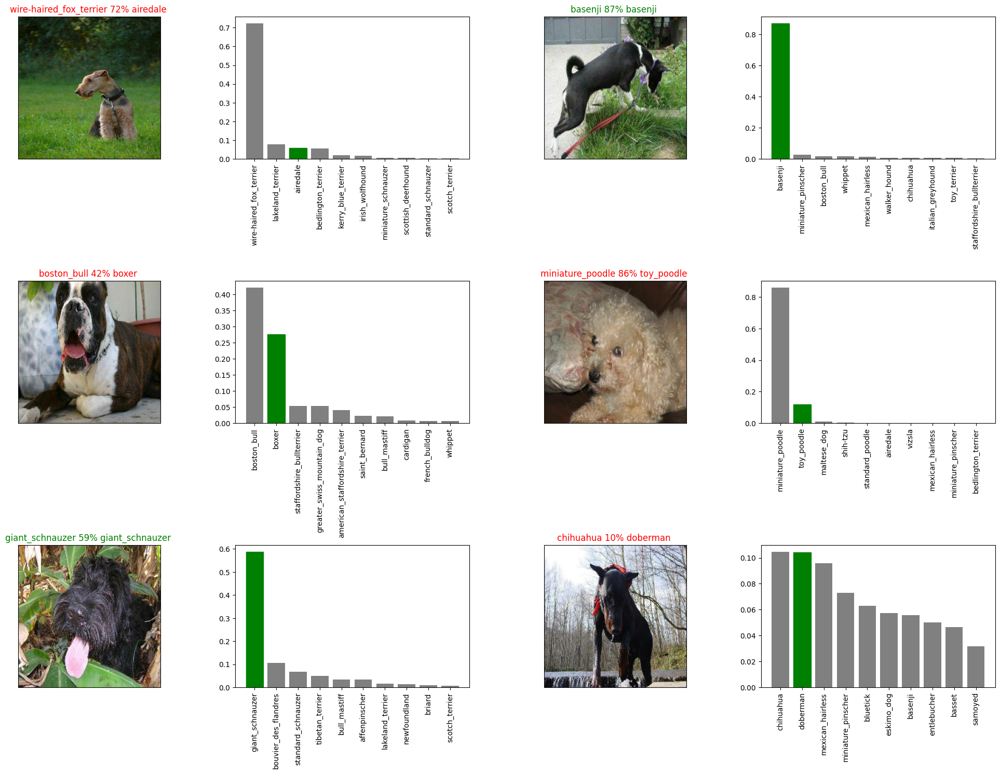

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize = (10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions,val_labels,val_images, n = i+i_multiplier)

  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, n=i+i_multiplier)

plt.tight_layout()
plt.show()


## Saving and exporting our model



In [ ]:
# Create a function to save model

def save_model(model, suffix = None):
  """
  Saves a given model in the specified directory and appends a suffix (string)
  """
  model_dir = os.path.join("drive/MyDrive/Dog-Vision/ML-Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  model_path = model_dir + "-" + suffix + ".h5"  #save format of a ML model
  print(f"Saving model to :{model_path}....")
  model.save(model_path)

  return model_path

In [ ]:
# Loading a model from directory ML-Models in local system

def load_model(model_path):
  print(f"Loading a saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer":hub.KerasLayer})

  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetV2-Adam")

Saving model to :drive/MyDrive/Dog-Vision/ML-Models/20230426-125332-1000-images-mobilenetV2-Adam.h5....


'drive/MyDrive/Dog-Vision/ML-Models/20230426-125332-1000-images-mobilenetV2-Adam.h5'

In [ ]:
# Load a trained model
image_model_1000 = load_model('drive/MyDrive/Dog-Vision/ML-Models/20230426-105240-1000-images-mobilenetV2-Adam.h5')

Loading a saved model from: drive/MyDrive/Dog-Vision/ML-Models/20230426-105240-1000-images-mobilenetV2-Adam.h5...


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 15s 2s/step - loss: 1.2876 - accuracy: 0.6450


[1.2876019477844238, 0.6449999809265137]

In [ ]:
image_model_1000.evaluate(val_data)

7/7 [==============================] - 26s 3s/step - loss: 1.1958 - accuracy: 0.6550


[1.1958374977111816, 0.6549999713897705]

## Training a Big Dog model 🐶 on the entire data set

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Creating a data batch with full data

full_data = create_data_batch(X, y)

Creating training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Builiding model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks

full_model_tensorboard = create_tensorboard_callback()
#No validation data now so we can't monitor validation accuracy

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

In [ ]:
# Fit the full model to full data
full_model.fit(x = full_data,
              epochs = NUM_EPOCHS,
              callbacks = [full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1422s 4s/step - loss: 1.2902 - accuracy: 0.6791
Epoch 2/100
320/320 [==============================] - 665s 2s/step - loss: 0.4017 - accuracy: 0.8831
Epoch 3/100
320/320 [==============================] - 681s 2s/step - loss: 0.2381 - accuracy: 0.9354
Epoch 4/100
320/320 [==============================] - 695s 2s/step - loss: 0.1557 - accuracy: 0.9628
Epoch 5/100
320/320 [==============================] - 637s 2s/step - loss: 0.1073 - accuracy: 0.9777
Epoch 6/100
320/320 [==============================] - 654s 2s/step - loss: 0.0761 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 675s 2s/step - loss: 0.0581 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 677s 2s/step - loss: 0.0467 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 672s 2s/step - loss: 0.0361 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 672s 2s/step - loss: 0.03

In [ ]:
save_model(full_model, suffix = "full-image-set-mobilenetV2-Adam")

Saving model to :drive/MyDrive/Dog-Vision/ML-Models/20230426-160152-full-image-set-mobilenetV2-Adam.h5....


'drive/MyDrive/Dog-Vision/ML-Models/20230426-160152-full-image-set-mobilenetV2-Adam.h5'

In [ ]:
#Loading the trained model
loaded_model = load_model("drive/MyDrive/Dog-Vision/ML-Models/20230426-160152-full-image-set-mobilenetV2-Adam.h5")

Loading a saved model from: drive/MyDrive/Dog-Vision/ML-Models/20230426-160152-full-image-set-mobilenetV2-Adam.h5...


## Importing test data set and making predictions on it

1. Since our model has been trained on images in form of tensor batches, we have to convert test data into the same format

2. luckily we have created `create_data_batch()` function for the same which will come in handy which takes a list of filenames as input and converts them into tensor batches

To make predictions on test data we will

* Get test image filenames
* Convert filenames into tensor batches using `create_data_batch()` and setting `test_data` parameter to `True` as test data doesn't have any labels
* Make a predictions array by passing the test batches to the `predict()` fucntion on our model

In [ ]:
# Load test image filnames
test_path = "drive/MyDrive/Dog-Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog-Vision/test/e30a97eb637239e3b15c903529e04800.jpg',
 'drive/MyDrive/Dog-Vision/test/de85fdcf74dbe025b9b89819735cb9bc.jpg',
 'drive/MyDrive/Dog-Vision/test/e514f86170698394e20f0cd1af968451.jpg',
 'drive/MyDrive/Dog-Vision/test/e4e991c432ce6d8e8ba26672ff8fb2f5.jpg',
 'drive/MyDrive/Dog-Vision/test/dcb5d319bd013bbfa9779d8c6c11a829.jpg',
 'drive/MyDrive/Dog-Vision/test/dcb9aeaf9f1a5c11e95509376d8788ca.jpg',
 'drive/MyDrive/Dog-Vision/test/e7a1b7a42db97df750aeae212a02d9c4.jpg',
 'drive/MyDrive/Dog-Vision/test/e26901a9e04f0ba89765fb9b9b7f675f.jpg',
 'drive/MyDrive/Dog-Vision/test/e71fde4ddc4c1adf9b4cf397e3904f74.jpg',
 'drive/MyDrive/Dog-Vision/test/e193c532dc7c9a5ee397848a1ee007f0.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batches

test_data = create_data_batch(test_filenames, test_data = True)

Creating test data batches


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Making prediction on data
test_predictions = loaded_model.predict(test_data, verbose = 1)

324/324 [==============================] - 925s 3s/step


In [ ]:
# Save predictions (Np array to csv)
np.savetxt("drive/MyDrive/Dog-Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions = np.loadtxt("drive/MyDrive/Dog-Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[0]

array([6.12520264e-04, 9.17291487e-09, 4.58048675e-08, 3.81620013e-11,
       1.44489013e-11, 5.89948812e-10, 5.52500114e-06, 1.99437328e-10,
       2.32347808e-09, 4.31997077e-10, 8.66630323e-10, 2.51790695e-08,
       1.82227673e-08, 5.53537127e-09, 2.67334155e-10, 7.97794719e-09,
       1.29867601e-08, 1.17682725e-10, 2.23640148e-10, 3.11796389e-09,
       5.67625840e-08, 1.92408289e-09, 1.12234657e-08, 1.96864832e-07,
       1.06610921e-10, 1.85463890e-07, 2.67153246e-06, 1.24460659e-11,
       2.70819131e-12, 4.65519762e-10, 1.69138925e-10, 7.99161848e-10,
       6.25664631e-10, 1.84828763e-09, 3.10039971e-12, 1.74571979e-09,
       5.47466392e-08, 5.22976237e-12, 3.36394107e-10, 1.26096855e-09,
       1.04573607e-10, 1.05777428e-10, 3.58576635e-08, 7.32582126e-13,
       4.69421906e-08, 2.05226214e-09, 6.85093648e-12, 9.97135885e-09,
       2.47628895e-09, 1.24061594e-10, 5.91755311e-10, 3.73642415e-08,
       4.65060879e-10, 1.30353515e-08, 3.94083488e-10, 1.60682201e-09,
      

## Preparing the test dataset for kaggle

Making a dataframe of required format

1. Create a pandas dataframe with an ID column and a column for each dog breed
2. Add data to the ID column by extracting the test image IDs from their filepaths.
3. Add data (prediction probabilities) to each of the dog breed column
4. Export dataframe as a csv to submit to kaggle.

In [ ]:
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image IDs to the prediction dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e30a97eb637239e3b15c903529e04800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,de85fdcf74dbe025b9b89819735cb9bc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e514f86170698394e20f0cd1af968451,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e4e991c432ce6d8e8ba26672ff8fb2f5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dcb5d319bd013bbfa9779d8c6c11a829,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,0716b7a11a2dd4141f3f1a8aa14eea2d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,08db8163ff5451ae44b7496b5c9ee05a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,0716352373a28d687d5df097512c5374,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,07ff89277767ddc115adeee8a6f0ceec,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column

preds_df[list(unique_breeds)] = test_predictions
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e30a97eb637239e3b15c903529e04800,6.125203e-04,9.172915e-09,4.580487e-08,3.816200e-11,1.444890e-11,5.899488e-10,5.525001e-06,1.994373e-10,2.323478e-09,...,3.355580e-09,4.884706e-09,4.814324e-10,1.131615e-09,2.778617e-09,5.268177e-08,1.177156e-07,7.230031e-08,2.532310e-10,1.348459e-03
1,de85fdcf74dbe025b9b89819735cb9bc,1.457915e-08,8.205163e-08,4.738055e-02,4.096752e-09,1.662741e-04,6.684990e-08,3.521825e-06,3.162332e-06,9.386901e-07,...,6.465103e-04,7.034673e-04,2.983506e-06,3.931258e-09,8.743736e-06,1.149161e-06,4.986976e-07,8.021262e-06,1.812910e-08,3.958798e-05
2,e514f86170698394e20f0cd1af968451,3.837727e-08,6.856399e-08,1.520210e-09,1.089091e-07,1.590307e-07,1.674554e-06,3.897239e-05,1.482342e-06,5.124917e-04,...,2.771417e-08,6.445130e-07,3.575328e-07,5.939555e-01,2.493557e-09,1.758438e-05,1.043750e-07,6.489719e-08,5.851040e-05,2.119914e-09
3,e4e991c432ce6d8e8ba26672ff8fb2f5,1.094094e-04,4.851782e-06,5.566920e-08,5.814713e-10,6.205558e-10,8.741352e-09,6.887445e-08,3.104887e-09,3.039945e-10,...,1.746825e-06,2.954085e-11,4.357032e-07,2.550177e-07,5.191732e-08,1.484360e-09,9.902336e-10,5.731943e-07,1.445969e-08,1.257210e-07
4,dcb5d319bd013bbfa9779d8c6c11a829,7.814780e-09,3.036906e-06,7.589967e-08,7.919149e-10,6.229811e-08,3.469815e-11,8.444966e-07,2.816808e-09,6.579264e-08,...,5.052918e-06,2.170595e-09,8.399005e-08,3.522734e-12,4.964355e-09,5.117023e-11,4.055921e-11,1.443064e-07,9.088208e-09,4.332086e-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,0716b7a11a2dd4141f3f1a8aa14eea2d,1.242813e-04,3.665755e-09,6.174266e-07,1.598367e-10,1.333728e-08,2.701869e-10,3.079577e-05,1.895052e-09,8.515808e-09,...,1.132598e-08,1.503557e-07,7.216399e-10,4.687651e-09,9.585277e-11,4.137322e-11,7.496330e-06,1.280209e-08,2.944964e-07,9.740547e-08
10353,08db8163ff5451ae44b7496b5c9ee05a,4.026927e-11,1.130517e-10,1.924004e-13,1.758399e-07,3.761469e-08,1.238786e-09,2.545583e-09,5.559984e-11,5.737921e-11,...,1.035504e-09,8.013757e-07,5.177140e-11,2.293040e-10,5.767123e-13,3.261766e-10,7.462489e-12,4.028888e-06,1.556900e-09,8.673693e-09
10354,0716352373a28d687d5df097512c5374,2.934140e-11,4.540616e-04,4.922196e-10,7.268671e-09,3.147136e-10,5.768712e-12,3.012273e-09,8.181568e-10,2.364375e-06,...,1.339194e-09,3.988000e-11,2.373661e-06,2.448153e-09,4.029089e-10,3.148391e-10,7.657900e-12,1.352231e-08,4.185442e-11,9.161476e-09
10355,07ff89277767ddc115adeee8a6f0ceec,9.042213e-10,5.412864e-08,2.106333e-11,1.000048e-09,2.946705e-07,7.759891e-11,3.305496e-10,1.979783e-09,6.838127e-09,...,5.205650e-08,3.727569e-12,7.951116e-10,1.588730e-08,5.108489e-12,2.402686e-08,1.272994e-06,9.017248e-08,5.381511e-07,8.668222e-10


In [ ]:
# Saving the dataframe in csv format in order to upload it to kaggle
preds_df.to_csv("drive/MyDrive/Dog-Vision/Kaggle-final-submission-file-dog-vision.csv", index = False)


In [ ]:
## We can make predictions on our own custom data as well using the above model